In [1]:
import os, sys
import numpy as np
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib
import matplotlib.pyplot as plt
import yaml

from getdist import loadMCSamples, plots, mcsamples, MCSamples
from tensiometer import utilities
from tensiometer import gaussian_tension

chain_dir = os.path.join(os.getcwd(), 'chains')

cosmo_prior = loadMCSamples(file_root=chain_dir+'/lcdm_eftboss/2023-10-12_10000_cosmo_prior_', 
                          settings={'ignore_rows':0., 'smooth_scale_1D':-1, 'smooth_scale_2D':-1})
cosmo_prior.name_tag = 'BOSS Prior'
# Check completeness
print(f'List of \"cosmological\" parameters: {cosmo_prior.getParamNames().getRunningNames()}')
print(f'     List of \"derived\" parameters: {cosmo_prior.getParamNames().getDerivedNames()}')

2023-11-03 12:58:23.354303: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-11-03 12:58:24.001559: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-03 12:58:24.001603: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-03 12:58:24.005695: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-11-03 12:58:24.337910: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-11-03 12:58:24.340874: I tensorflow/core/platform/cpu_feature_guard.cc:182] This Tens

List of "cosmological" parameters: ['omega_b', 'omega_cdm', 'h', 'ln10^{10}A_s', 'n_s']
     List of "derived" parameters: ['Omega_m', 'A_s', 'sigma8']


In [2]:
# Add S8 as a derived parameter using GetDist
p = cosmo_prior.getParams()
cosmo_prior.addDerived(p.sigma8*np.sqrt(p.Omega_m/0.3), name='S8', label='S_8')

# Repeat the process for the posterior
posterior = loadMCSamples(file_root=chain_dir+'/lcdm_eftboss/2023-10-12_10000_',
                          settings={'ignore_rows':0.3, 'smooth_scale_1D':-1, 'smooth_scale_2D':-1})
posterior.name_tag = 'BOSS'

p = posterior.getParams()
posterior.addDerived(p.sigma8*np.sqrt(p.Omega_m/0.3), name='S8', label='S_8')

from python_scripts.prior import * 
# Get parameters' fixed prior boundaries
prior = priorChain(filepath='chains/lcdm_eftboss/2023-10-12_10000_.paramnames', input_name='eftboss')

In [3]:
# Nuisance Parameters (varying)
nuisance_prior = prior.get_nuisance_prior(config_name='boss_pk_wc', ignore_rows=0.)
nuisance_prior.name_tag = 'Nuisance Prior'
nuisance_names = prior.nuisance_names

### Complete Set
We now reproduce the previous work session including also the EFT nuisance parameters. The complete set of parameters becomes: $h$, $\omega_{cdm}$, $\ln{10^{10}A_s}$, $n_s$, $\Omega_m$, $\sigma_8$, $b1_{hN}$, $c2_{hN}$, $b1_{hS }$, $c2_{hS }$, $b1_{lN }$, $c2_{lN }$, $b1_{lS }$, $c2_{lS }$. 

In [4]:
# Loading both cosmological and EFT parameters
prior_chain = cosmo_prior.copy()
posterior_chain = posterior.copy()
p = nuisance_prior.getParams()
for name, label in zip(prior.nuisance_names, prior.nuisance_labels):
    method = getattr(p, name)
    prior_chain.addDerived(method, name=name, label=label)
prior_chain.name_tag = 'BOSS Prior'

In [5]:
# EFT params resulting as derived parameters
print(f'List of \"cosmological\" parameters: {prior_chain.getParamNames().getRunningNames()}')
print(f'     List of \"derived\" parameters: {prior_chain.getParamNames().getDerivedNames()}')

List of "cosmological" parameters: ['omega_b', 'omega_cdm', 'h', 'ln10^{10}A_s', 'n_s']
     List of "derived" parameters: ['Omega_m', 'A_s', 'sigma8', 'S8', 'b1_hN', 'c2_hN', 'b1_hS', 'c2_hS', 'b1_lN', 'c2_lN', 'b1_lS', 'c2_lS']


Non-log N_eff 	= 12.05



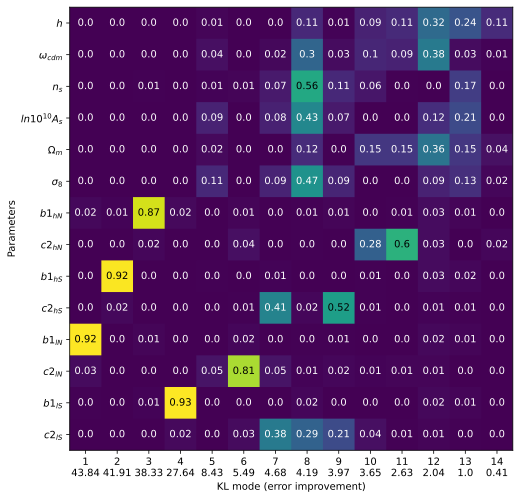

In [6]:
# Re-definition of params
params = ['h', 'omega_cdm', 'n_s', 'ln10^{10}A_s', 'Omega_m', 'sigma8', 
                'b1_hN', 'c2_hN', 'b1_hS', 'c2_hS', 'b1_lN', 'c2_lN', 'b1_lS', 'c2_lS']
labels = ['h', '\omega_{cdm}', 'n_s', '\ln{10^{10}A_s}', '\Omega_m', '\sigma_8',
                'b1_{hN}', 'c2_{hN}', 'b1_{hS}', 'c2_{hS}', 'b1_{lN}', 'c2_{lN}', 'b1_{lS}', 'c2_{lS}']

def plot_frac_fisher(prior_chain=MCSamples(), posterior_chain=MCSamples(), params=[], labels=[], log=False, print_improvement=False):
    # Non-logarithmic effective number of parameters
    print(f'Non-log N_eff \t= {gaussian_tension.get_Neff(posterior_chain, prior_chain=prior_chain, param_names=params):.5}\n')
    KL_param_names = params
    # Logarithmic transformation
    if log:
        # Take the logarithm of the parameters: KL decomposition -> power-law decomposition
        log_params = []
        log_labels = []
        for name, label in zip(params, labels):
            for chain in [prior_chain, posterior_chain]:
                p = chain.getParams()
                method = getattr(p, name)
                chain.addDerived(np.log(method), name='log_'+name, label='\\log '+label)
            log_params += ['log_'+name]
            log_labels += ['\\log '+label]
        # Logarithmic effective number of parameters
        print(f'Non-log N_eff \t= {gaussian_tension.get_Neff(posterior_chain, prior_chain, param_names=log_params):.5}\n')
        KL_param_names = log_params
    
    # Compute the KL modes
    KL_eig, KL_eigv, KL_param_names = gaussian_tension.Q_UDM_KL_components(prior_chain, posterior_chain, 
                                                                        param_names=KL_param_names)
    
    if print_improvement:
        with np.printoptions(precision=2, suppress=True):
            if any(eig < 1. for eig in KL_eig):
                print('Improvement factor over the prior:\n', KL_eig)
                print('Discarding error units due to negative values.')
            else:
                print('Improvement factor over the prior in E.U.:\n', np.sqrt(KL_eig-1))

    # Compute the fractional Fisher matrix
    KL_param_names, KL_eig, fractional_fisher, _ = gaussian_tension.Q_UDM_fisher_components(prior_chain, posterior_chain, 
                                                                                            KL_param_names, 
                                                                                            which='1')
    # Plot (showing values and names)
    figsize = int(len(params)/1.6)
    plt.figure(figsize=(figsize, figsize))
    im1 = plt.imshow(fractional_fisher, cmap='viridis')
    num_params = len(fractional_fisher)
    # The following loop is used to display the fractional fisher values inside the cells
    for i in range(num_params):
        for j in range(num_params):
            if fractional_fisher[j,i]>0.5:
                col = 'k'
            else:
                col = 'w'
            plt.text(i, j, np.round(fractional_fisher[j,i],2), va='center', ha='center', color=col)
    plt.xlabel('KL mode (error improvement)');
    plt.ylabel('Parameters');
    ticks  = np.arange(num_params)
    if any(eig < 1. for eig in KL_eig):
        labels = [str(t+1)+'\n'+str(l) for t,l in zip(ticks, np.round(KL_eig, 2))]
    else:
        labels = [str(t+1)+'\n'+str(l) for t,l in zip(ticks, np.round(np.sqrt(KL_eig-1), 2))]
    plt.xticks(ticks, labels, horizontalalignment='center');
    labels = ['$'+posterior_chain.getParamNames().parWithName(name).label+'$' for name in KL_param_names]
    plt.yticks(ticks, labels, horizontalalignment='right');

    return KL_eig, KL_eigv, KL_param_names

KL_eig, KL_eigv, KL_param_names = plot_frac_fisher(prior_chain=prior_chain, posterior_chain=posterior_chain, 
                                                   params=params, labels=labels)

As you can see, the first 4 modes mainly inform the 4 sky-cuts of the EFT parameter $b1$: if we inspect this parameter's prior distribution we realize that it is flat whithin a large range if compared with the posterior expected variance. This is equivalent to setting an uninformative prior: this parameter's values are therefore strongly data-constrained, and the most variance preserved by the KL modes is projected onto these directions. 

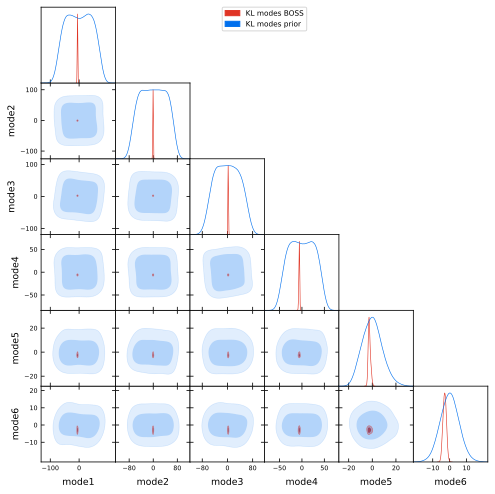

In [7]:
# List of indexes associated to each parameter
idx = [posterior_chain.index[name] for name in KL_param_names]
prior_mean = prior_chain.getMeans(pars=[prior_chain.index[name] for name in KL_param_names])
temp_names = ['mode'+str(i+1) for i in range(len(KL_param_names))]
# Projection on the KL modes
KL_filtered_samples = np.dot(posterior_chain.samples[:,idx]-prior_mean, KL_eigv)
# Building the chains using the same loglikes and weights of the original distributions
KL_chain = MCSamples(samples=KL_filtered_samples, 
                    loglikes=posterior_chain.loglikes, 
                    weights=posterior_chain.weights, 
                    names=temp_names, 
                    label='KL modes BOSS')
# Repeat for the prior
idx = [prior_chain.index[name] for name in KL_param_names]
KL_filtered_prior_samples = np.dot(prior_chain.samples[:,idx]-prior_mean, KL_eigv)
KL_prior_chain = MCSamples(samples=KL_filtered_prior_samples, 
                        loglikes=prior_chain.loglikes, 
                        weights=prior_chain.weights, 
                        names=temp_names, 
                        label='KL modes prior')
g = plots.get_subplot_plotter(width_inch=7)
g.settings.alpha_filled_add = 0.3
g.triangle_plot([KL_chain, KL_prior_chain], params=temp_names[:6], filled=True)

From the previous plot we notice that the first 4 modes are showing very constrained directions, that is, the 4 $b1$ sky-cuts, dominated by the data in spite of the uninformative flat prior. We included 2 additional modes for comparison: the latter are definitely wider. 

In [8]:
# param_map='N' means "No transformation applied to the parameters"
print(gaussian_tension.KL_PCA(prior_chain, posterior_chain, params, num_modes=12,
                              localize=True, param_map='N', verbose=False, dimensional_threshold=0.15)[0])

Neff original =  10000.0 
Neff new      =  9.854 
this can result in large errors and can be improved with more samples in chain_1.
KLCA for 14 parameters:

KL amplitudes - 1 (covariance/variance improvement per mode)
KLC 1: 348.9202 (  1867.9 %)
KLC 2: 246.4261 (  1569.8 %)
KLC 3:  58.2860 (   763.5 %)
KLC 4:  45.4455 (   674.1 %)
KLC 5:  36.1632 (   601.4 %)
KLC 6:  32.7880 (   572.6 %)
KLC 7:  19.0277 (   436.2 %)
KLC 8:  11.9318 (   345.4 %)
KLC 9:   8.8939 (   298.2 %)
KLC10:   3.9218 (   198.0 %)
KLC11:   2.9912 (   173.0 %)
KLC12:   1.1198 (   105.8 %)

Parameter contribution to KL-mode variance
 mode number :       1       2       3       4       5       6       7       8       9      10      11      12
           h :   0.001   0.040   0.005   0.004   0.014   0.009   0.024   0.010   0.012   0.045   0.202   0.022
   omega_cdm :   0.023   0.062   0.013   0.329   0.101   0.073   0.228   0.045   0.142   0.142   0.023   0.113
         n_s :   0.042   0.004   0.047   0.002   0.009   

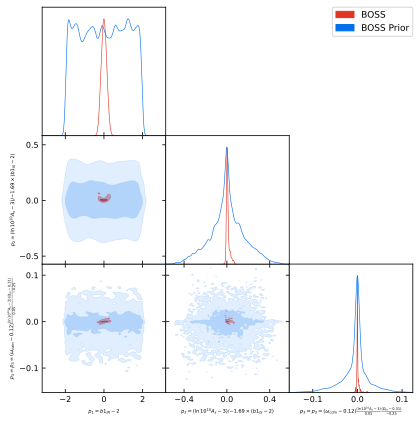

In [9]:
# First 3 best-constrained directions
temp_posterior_chain = posterior_chain.copy()
temp_prior_chain = prior_chain.copy()
p_post = temp_posterior_chain.getParams()
p_prior = temp_prior_chain.getParams() 
temp_posterior_chain.addDerived(p_post.b1_lN-2., 
                        name='p1', label='p_1 = b1_{lN} - 2');
A_s = getattr(p_post, 'ln10^{10}A_s')
temp_posterior_chain.addDerived(((A_s - 3.)/-1.69)*((p_post.b1_lS - 2.)),
                        name='p2', label='p_2 = {(\\ln{10^{10}A_s} - 3)/{-1.69}} \\times (b1_{lS} - 2)')
temp_posterior_chain.addDerived((p_post.omega_cdm - 0.12)*((A_s - 3.)/0.05)*((p_post.Omega_m - 0.31)/(-0.25)),
                        name='p3', label='p_3 = p_3 = (\\omega_{cdm} - 0.12) \\frac{(\\ln{10^{10}A_s} - 3)}{0.05} \\frac{(\\Omega_m - 0.31)}{-0.25}')

temp_prior_chain.addDerived(p_prior.b1_lN-2., 
                      name='p1', label='p_1 = b1_{lN} - 2');
A_s = getattr(p_prior, 'ln10^{10}A_s')
temp_prior_chain.addDerived(((A_s - 3.)/-1.69)*((p_prior.b1_lS - 2.)),
                        name='p2', label='p_2 = {(\\ln{10^{10}A_s} - 3)/{-1.69}} \\times (b1_{lS} - 2)')
temp_prior_chain.addDerived((p_prior.omega_cdm - 0.12)*((A_s - 3.)/0.05)*((p_prior.Omega_m - 0.31)/(-0.25)),
                        name='p3', label='p_3 = (\\omega_{cdm} - 0.12) \\frac{(\\ln{10^{10}A_s} - 3)}{0.05} \\frac{(\\Omega_m - 0.31)}{-0.25}')

g = plots.get_subplot_plotter(width_inch=6)
g.settings.axes_labelsize = 1.5
g.settings.alpha_filled_add = 0.3
g.triangle_plot([temp_posterior_chain, temp_prior_chain], params=['p1', 'p2', 'p3'], filled=True)

We end up with very peaked distributions around the central value of $0$. As you can see, the first 2 best-constrained combinations depend on $b1$, once again showing this parameter's strong posterior improvement over the prior.

Finally, repeat the *prior removal* by sending it to zero or to infinity.

In [10]:
idx = [posterior_chain.index[name] for name in KL_param_names]
prior_mean = prior_chain.getMeans(pars=[prior_chain.index[name] for name in KL_param_names])
posterior_mean = posterior_chain.getMeans(pars=[posterior_chain.index[name] for name in KL_param_names])
inv_KL_eigv = np.linalg.inv(KL_eigv)
# Only keeping the first 11 modes
inv_KL_eigv[11:,:] = 0.
# Project the shifted posterior samples on the KL modes
KL_filtered_samples = np.dot(np.dot(posterior_chain.samples[:,idx]-prior_mean, KL_eigv), inv_KL_eigv)+prior_mean

In [11]:
# Remember that, in this case, we did not apply a logarithmic transformation to the parameters
for name, prior_mean, post_mean in zip(KL_param_names, prior_mean, posterior_mean):
    print(name, ':')
    print(f' prior     = {prior_mean:.4}')
    print(f' posterior = {post_mean:.4}\n')

h :
 prior     = 0.6749
 posterior = 0.6824

omega_cdm :
 prior     = 0.1198
 posterior = 0.1221

n_s :
 prior     = 0.9643
 posterior = 0.9167

ln10^{10}A_s :
 prior     = 3.047
 posterior = 2.932

Omega_m :
 prior     = 0.3139
 posterior = 0.3113

sigma8 :
 prior     = 0.8204
 posterior = 0.7623

b1_hN :
 prior     = 1.99
 posterior = 2.057

c2_hN :
 prior     = 0.01052
 posterior = 0.6593

b1_hS :
 prior     = 2.007
 posterior = 2.144

c2_hS :
 prior     = 0.01474
 posterior = 1.23

b1_lN :
 prior     = 1.999
 posterior = 2.001

c2_lN :
 prior     = 0.02448
 posterior = 1.245

b1_lS :
 prior     = 2.012
 posterior = 1.961

c2_lS :
 prior     = 0.03032
 posterior = 1.164



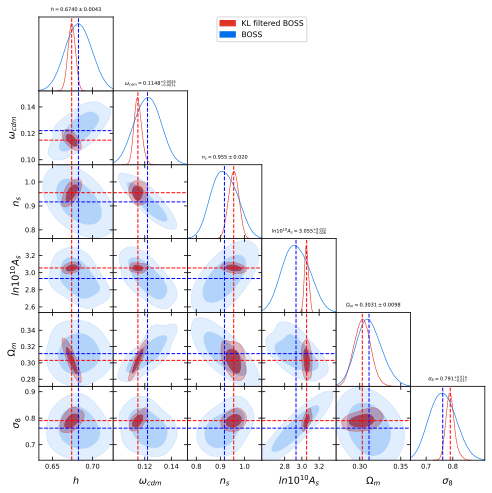

In [12]:
# Prior Shrinking
KL_chain = MCSamples(samples=KL_filtered_samples, 
                     loglikes=posterior_chain.loglikes, 
                     weights=posterior_chain.weights, 
                     names=params, 
                     labels=[name.label for name in posterior_chain.getParamNames().parsWithNames(params)], 
                     label='KL filtered BOSS',
                     settings={'ignore_rows':0.})
g = plots.get_subplot_plotter(width_inch=8)
g.settings.alpha_filled_add = 0.3
g.settings.title_limit_fontsize = 0.8
# The titles refer to the mean values of the KL posterior distributions
# Cosmological Parameters
temp_params = params[:6]
g.triangle_plot([KL_chain, posterior_chain], params=temp_params, filled=True, title_limit=1)
KL_means = KL_chain.getMeans(pars=[KL_chain.index[name] for name in temp_params])
means = posterior_chain.getMeans(pars=[posterior_chain.index[name] for name in temp_params])
# Display mean indicators
for i in range(len(temp_params)):
    # Fix the column, change the row -> decreasing from len(cosmo_params)
    for ax in g.subplots[i:,i]:
        ax.axvline(KL_means[i], color='red', lw=1., ls='--')
        ax.axvline(means[i], color='blue', lw=1., ls='--')
    # Fix the row, change the column -> increasing from 0
    for ax in g.subplots[i,:i]:
        ax.axhline(KL_means[i], color='red', lw=1., ls='--')
        ax.axhline(means[i], color='blue', lw=1., ls='--')

In [13]:
# EFT Parameters
g = plots.get_subplot_plotter(width_inch=10)
g.settings.alpha_filled_add = 0.3
g.settings.title_limit_fontsize = 0.8
# The titles refer to the mean values of the KL posterior distributions
temp_params = params[6:]
g.triangle_plot([KL_chain, posterior_chain], params=temp_params, filled=True, title_limit=1)
KL_means = KL_chain.getMeans(pars=[KL_chain.index[name] for name in temp_params])
means = posterior_chain.getMeans(pars=[posterior_chain.index[name] for name in temp_params])
# Display mean indicators
for i in range(len(temp_params)):
    # Fix the column, change the row -> decreasing from len(cosmo_params)
    for ax in g.subplots[i:,i]:
        ax.axvline(KL_means[i], color='red', lw=1., ls='--')
        ax.axvline(means[i], color='blue', lw=1., ls='--')
    # Fix the row, change the column -> increasing from 0
    for ax in g.subplots[i,:i]:
        ax.axhline(KL_means[i], color='red', lw=1., ls='--')
        ax.axhline(means[i], color='blue', lw=1., ls='--')

In [14]:
# Prior Explosion
idx = [posterior_chain.index[name] for name in KL_param_names]
prior_mean = prior_chain.getMeans(pars=[prior_chain.index[name] for name in KL_param_names])
inv_KL_eigv = np.linalg.inv(KL_eigv)
# Invert the values then send them to 0: this is equivalent to set them to infinity
KL_eig_inv = 1./KL_eig
KL_eig_inv[:12] = 0.
KL_filtered_samples = np.dot(np.dot(np.diag(1./(1.-KL_eig_inv)), 
                                    np.dot(KL_eigv.T, (posterior_chain.samples[:,idx]).T)).T-np.dot(np.diag(1./(1.-KL_eig_inv)*KL_eig_inv), 
                                                                                          np.dot(KL_eigv.T, prior_mean)), 
                                    inv_KL_eigv)

KL_chain = MCSamples(samples=KL_filtered_samples, 
                     loglikes=posterior_chain.loglikes, 
                     weights=posterior_chain.weights, 
                     names=params, 
                     labels=[name.label for name in posterior_chain.getParamNames().parsWithNames(params)], 
                     label='KL filtered BOSS',
                     settings={'ignore_rows':0.})

In [15]:
# Cosmological Parameters
g = plots.get_subplot_plotter(width_inch=8)
g.settings.alpha_filled_add = 0.3
# The titles refer to the mean values of the KL posterior distributions
temp_params = params[:6]
g.triangle_plot([posterior_chain, KL_chain], params=temp_params, filled=True, title_limit=1);
KL_means = KL_chain.getMeans(pars=[KL_chain.index[name] for name in temp_params])
means = posterior_chain.getMeans(pars=[posterior_chain.index[name] for name in temp_params])
# Display mean indicators
for i in range(len(temp_params)):
    # Fix the column, change the row -> decreasing from len(cosmo_params)
    for ax in g.subplots[i:,i]:
        ax.axvline(KL_means[i], color='blue', lw=1., ls='--')
        ax.axvline(means[i], color='red', lw=1., ls='--')
    # Fix the row, change the column -> increasing from 0
    for ax in g.subplots[i,:i]:
        ax.axhline(KL_means[i], color='blue', lw=1., ls='--')
        ax.axhline(means[i], color='red', lw=1., ls='--')